In [404]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
from sklearn.metrics import confusion_matrix, roc_auc_score ,classification_report
import numpy as np

In [405]:
import tensorflow as tf

# Check available GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    print(f"Found {len(gpus)} GPU(s): {gpus}")
else:
    print("No GPU found.")


No GPU found.


set up paths and pareameters

In [406]:
#set path to data set
base_dir = 'reference'
train_cats_dir = os.path.join(base_dir,'cats')
train_dogs_dir = os.path.join(base_dir,'dogs')

#set image size and batch size
IMG_size = (150,150)
BATCH_SIZE = 10

use imageDataGenerator for augmentation training data

imageDataGenerator is applied dynamically as each batch of images is fetched from the generator, rather than being pre-computed and stored beforehand.

so when i call the model.fit() function, it will automatically apply the image data generator to the training data.

provide rendomness  to the model during training.



In [407]:
train_datagen = ImageDataGenerator(
    #these are rendomly applyed to each image
    rescale = 1.0/255,#This normalizes the pixel values of the images from the range [0, 255] to [0, 1]. This is important because neural networks perform better with smaller input values.
    rotation_range = 40,# randomly rotated by up to 40 degrees
    width_shift_range = 0.2,#shifts the images horizontally (left or right) by up to 20% of the image's width.
    height_shift_range = 0.2,
    shear_range=0.2,       # Shear transformations
    zoom_range=0.2,        # Randomly zoom in/out on images
    horizontal_flip=True,  # Randomly flip images horizontally
    fill_mode='nearest',    # Fill in pixels with the nearest value when augmented.
    validation_split=0.1  # Split for validation
)

#use different  data generators for training and validation
#because  the validation data dont need to  be augmented

val_datagen = ImageDataGenerator(
    rescale = 1.0/255, # Only rescaling
    validation_split=0.1  # Split for validation
)

load the training data

flow_from_directory will reads images from a directory, resizes them, and applies augmentation to this batch of images.

In [408]:
train_data = train_datagen.flow_from_directory(
    base_dir,  #path to training data
    target_size = IMG_size, #resize image
    batch_size = BATCH_SIZE, # fetch  images in batches
    class_mode = 'binary', #  binary classification
    subset = 'training'
)

val_data = val_datagen.flow_from_directory(
    base_dir,
    target_size = IMG_size, #resize image
    batch_size = BATCH_SIZE, # fetch  images in batches
    class_mode = 'binary', #  binary classification
    subset = 'validation',
)

Found 90 images belonging to 2 classes.
Found 10 images belonging to 2 classes.


build the CNN model

In [409]:
model = tf.keras.Sequential()

# First convolutional layer
# 32 filters, (3, 3) filter size, 'relu' activation, input shape specified for the first layer
model.add(tf.keras.layers.Conv2D(32,(3,3),activation = 'relu',input_shape = (150,150,3)))
#add a pooling layer after  the convolutional layer,to reduce dimensions of the feature maps
#max pooling means we take the maximum value from each 2x2 window,use this 2*2 window to scan the feacher map
model.add(tf.keras.layers.MaxPooling2D((2,2)))

#second convolutional layer
model.add(tf.keras.layers.Conv2D(64,(3,3),activation = 'relu'))
model.add(tf.keras.layers.MaxPooling2D((2,2)))

#third convolutional layer
model.add(tf.keras.layers.Conv2D(64,(3,3),activation = 'relu'))
model.add(tf.keras.layers.MaxPooling2D((2,2)))



# Flatten the 2D feature maps to a 1D vector
model.add(tf.keras.layers.Flatten(name='flatten'))

#Dense layer with 512 units and 'relu' activation
#why we use dense layer?
#because the convolutional layer can only  extract local features,we need to use dense layer to extract global features
model.add(tf.keras.layers.Dense(128,activation = 'relu'))

#dropout  layer to prevent overfitting,randomly set a fraction of neurons to 0 during training
#these neurons will not be updated during training
model.add(tf.keras.layers.Dropout(0.5))



#output layer
model.add(tf.keras.layers.Dense(1,activation = 'sigmoid'))

# Compile the model with binary cross-entropy loss and the Adam optimizer
model.compile(loss='binary_crossentropy', optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005), metrics=['accuracy'])

# Display a summary of the model structure
model.summary()


c:\Users\j9902\AppData\Local\Programs\Python\Python39\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_69 (Conv2D)              │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_69 (MaxPooling2D) │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_70 (Conv2D)              │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_70 (MaxPooling2D) │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_71 (Conv2D)              │ (None, 34, 34, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_71 (MaxPooling2D) │ (None, 17, 17, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 18496)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_40 (Dense)                │ (None, 128)            │     2,367,616 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_21 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,424,065 (9.25 MB)

 Trainable params: 2,424,065 (9.25 MB)

 Non-trainable params: 0 (0.00 B)

train the model

In [410]:
# Train the model
history = model.fit(
    train_data, #generate train data
    validation_data= val_data,  #generate validation data

    epochs=100
)


c:\Users\j9902\AppData\Local\Programs\Python\Python39\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 4s 179ms/step - accuracy: 0.4291 - loss: 0.7131 - val_accuracy: 0.5000 - val_loss: 0.6945
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - accuracy: 0.5449 - loss: 0.7030 - val_accuracy: 0.5000 - val_loss: 0.6910
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - accuracy: 0.5554 - loss: 0.6814 - val_accuracy: 0.5000 - val_loss: 0.6852
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - accuracy: 0.5873 - loss: 0.6780 - val_accuracy: 0.5000 - val_loss: 0.6889
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - accuracy: 0.4774 - loss: 0.6569 - val_accuracy: 0.5000 - val_loss: 0.6801
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - accuracy: 0.7921 - loss: 0.6070 - val_accuracy: 0.4000 - val_loss: 0.6779
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - accuracy: 0.6914 - loss: 0.5950 - val_accuracy: 0.5000 - val_loss: 0.7170
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - accuracy: 0.6682 - loss: 0.6000 - val_accuracy: 0.6000 - v

Save Model Weights and Calculate Parameters

In [411]:
model.save_weights('HW4.weights.h5')
total_params = model.count_params()
print(f"Total Parameters: {total_params}")


Total Parameters: 2424065


Evaluate Model and Generate Confusion Matrix & AUROC

In [412]:
val_preds = model.predict(val_data)
val_labels = val_data.classes


# Step 2: Convert predicted probabilities to binary labels
# If the model predicts a probability > 0.5, classify as class '1' (e.g., dog), otherwise as '0' (e.g., cat)
val_preds_binary = (val_preds > 0.5).astype(int).flatten()

# Step 3: Generate the Confusion Matrix
conf_matrix = confusion_matrix(val_labels, val_preds_binary)
print("Confusion Matrix:\n", conf_matrix)

# Step 4: Calculate AUROC
# Since we are using probabilities directly, we can calculate AUROC with val_preds (not binarized)
auroc_score = roc_auc_score(val_labels, val_preds)
print("AUROC Score:", auroc_score)

# Optional: Detailed Classification Report (Precision, Recall, F1-Score)
print("Classification Report:\n", classification_report(val_labels, val_preds_binary, target_names=['Cat', 'Dog']))


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
Confusion Matrix:
 [[1 4]
 [3 2]]
AUROC Score: 0.24000000000000002
Classification Report:
               precision    recall  f1-score   support

         Cat       0.25      0.20      0.22         5
         Dog       0.33      0.40      0.36         5

    accuracy                           0.30        10
   macro avg       0.29      0.30      0.29        10
weighted avg       0.29      0.30      0.29        10



利用model.load_weights()載入權重，並針對 test/資料夾下的20張圖片進行預測。

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


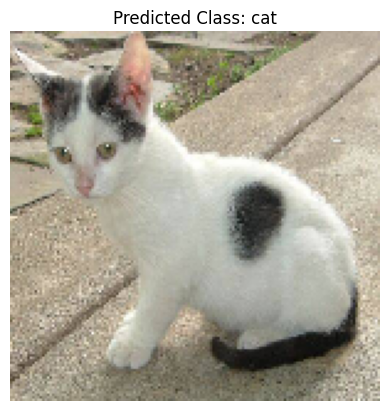

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


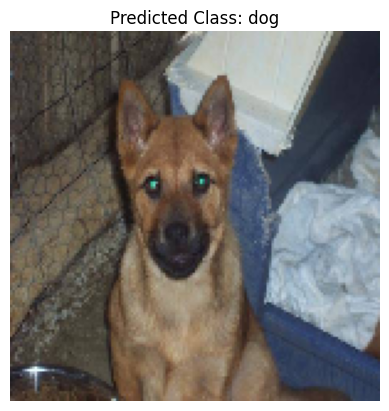

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


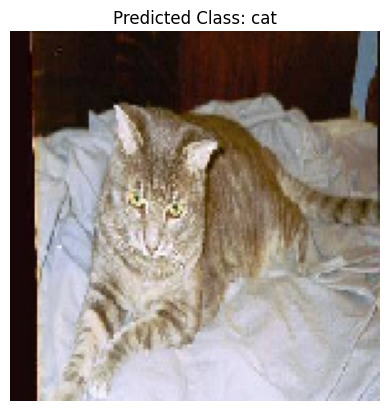

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


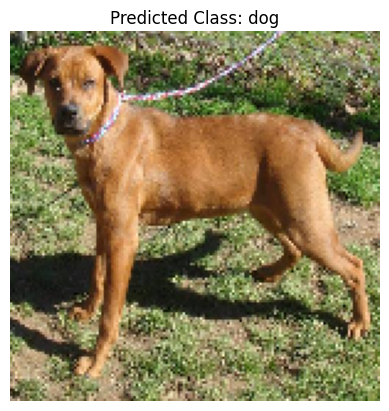

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


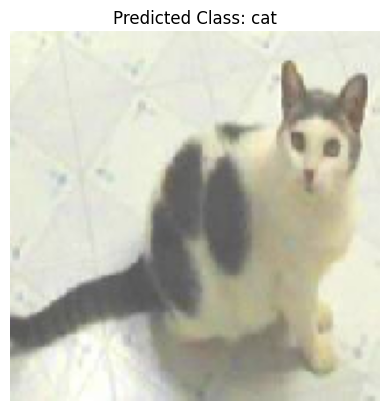

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


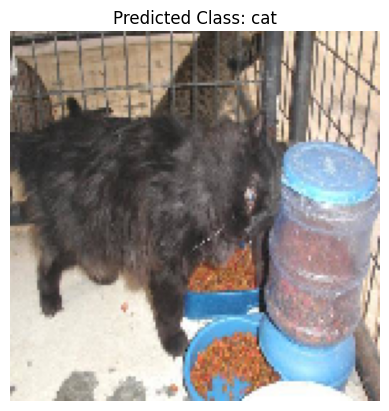

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


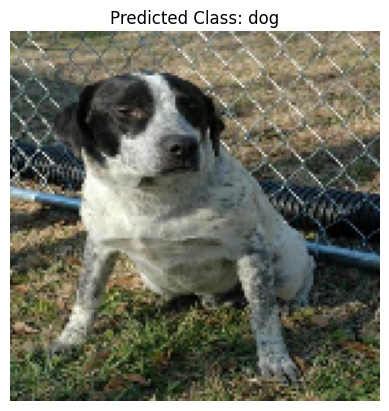

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


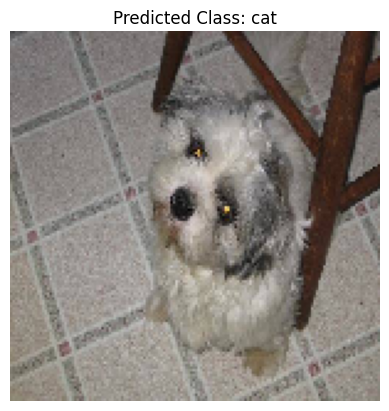

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


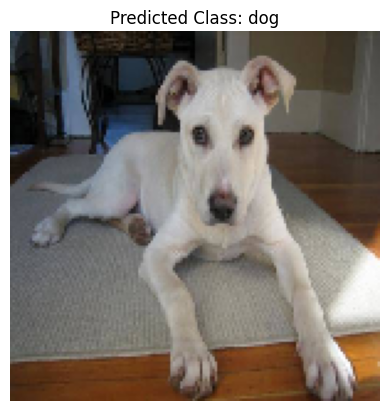

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


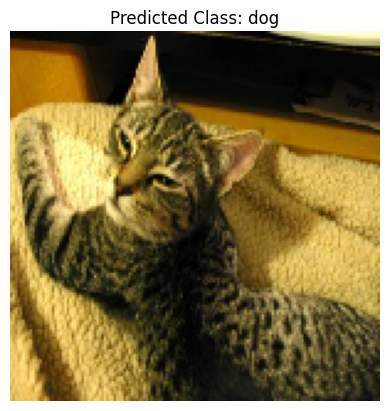

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


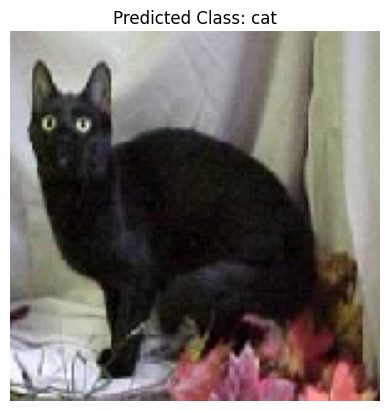

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


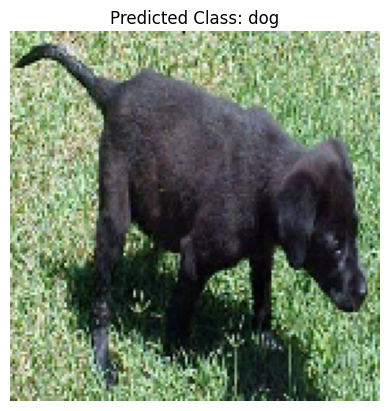

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


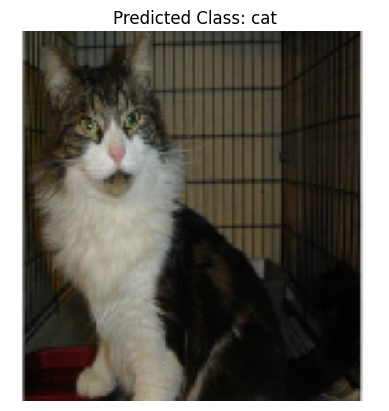

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


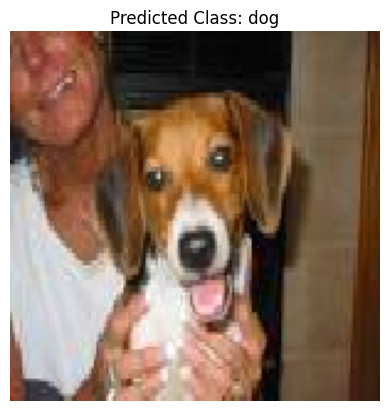

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


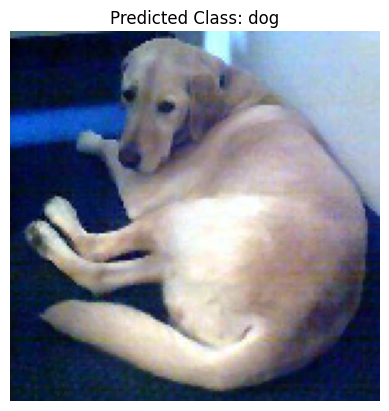

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


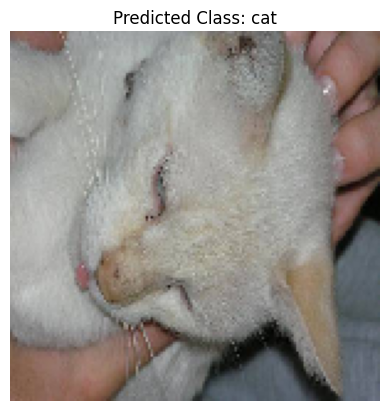

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


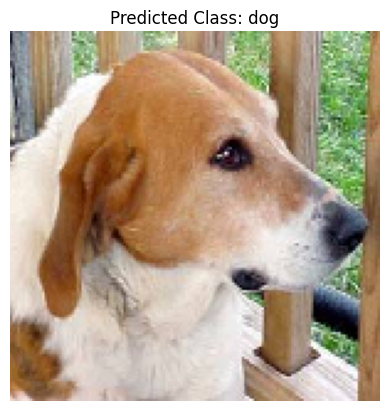

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


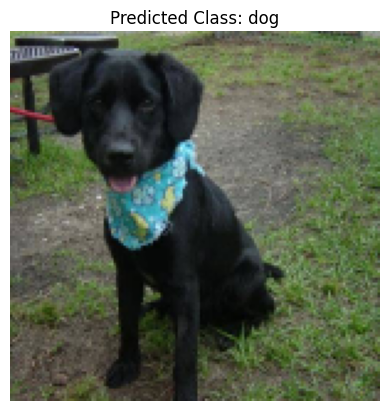

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


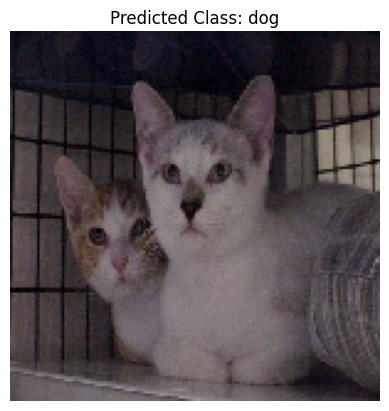

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


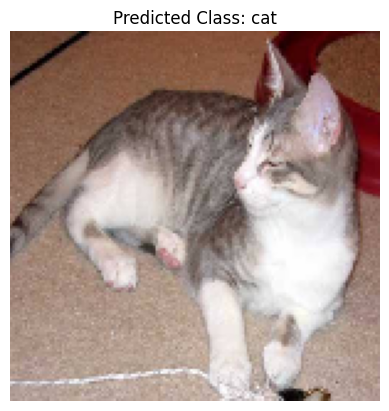

In [416]:

from tensorflow.keras.preprocessing import image

# Load model weights
model.load_weights('HW4.weights.h5')

# Directory containing the test images
test_dir = 'test/'

# Loop through images pic1.jpg to pic20.jpg in the test directory
for i in range(1, 21):
    img_path = os.path.join(test_dir, f'pic{i}.jpg')
    
    # Load and preprocess the image
    img = image.load_img(img_path, target_size=(150, 150))  
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0) 
    img_array /= 255.0  

    # Make a prediction
    predictions = model.predict(img_array)
    predicted_class = 'dog' if predictions[0] > 0.5 else 'cat'  

    plt.imshow(img)
    plt.title(f'Predicted Class: {predicted_class}')
    plt.axis('off')
    plt.show()


### 第一小題比較結果

共有3張預測錯誤

## 第二小題
####  保留到flattern之間的神經網路，做為產生圖片embedding vector 之模組

 truncated model up to the 'flatten' layer

In [414]:
# Create the truncated model up to the 'flatten' layer
truncated_model = tf.keras.Model(inputs=model.layers[0].input, outputs=model.get_layer('flatten').output)

# Display a summary of the truncated model
truncated_model.summary()


Model: "functional_236"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_23 (InputLayer)     │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_69 (Conv2D)              │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_69 (MaxPooling2D) │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_70 (Conv2D)              │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_70 (MaxPooling2D) │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_71 (Conv2D)              │ (None, 34, 34, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_71 (MaxPooling2D) │ (None, 17, 17, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 18496)          │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 56,320 (220.00 KB)

 Trainable params: 56,320 (220.00 KB)

 Non-trainable params: 0 (0.00 B)

### 使用HW1的KNN原理進行預測

Implement a function that uses the truncated_model to generate embedding vectors for the 20 images in the test/ directory. Also, process the 100 reference images located in ./reference/cats/ (50 images of cats named cat.1.jpg to cat.50.jpg) and ./reference/dogs/ (50 images of dogs named dog.1.jpg to dog.50.jpg).

For each test image:

Generate its embedding vector using truncated_model.
Compute the Euclidean distance between this embedding vector and those of the 100 reference images.
Identify the 5 most similar reference images based on the smallest Euclidean distances.
Display the paths of these 5 closest images on the screen.
Classify the test image by taking the majority class (cat or dog) of these 5 nearest images and compare this classification with the original model's prediction. Report the accuracy difference between this custom KNN approach and the model's original classification accuracy.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━

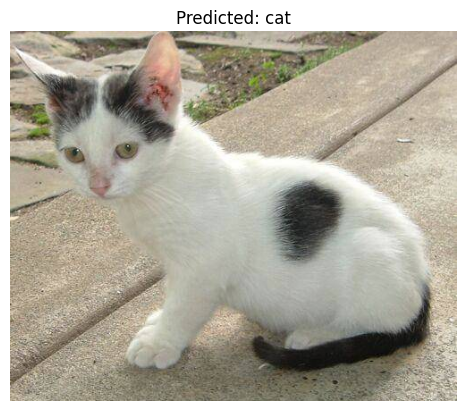

Test Image Path: C:\Users\j9902\Desktop\大三上\ML intro\ML-HW4\test\pic10.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


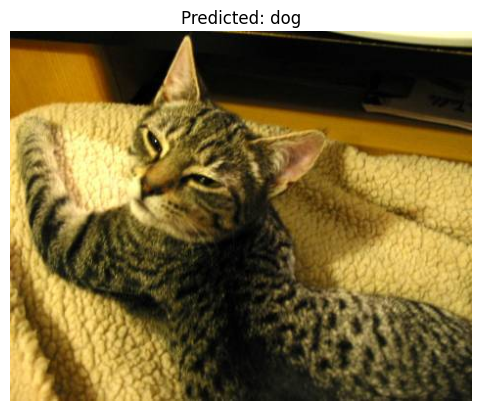

Test Image Path: C:\Users\j9902\Desktop\大三上\ML intro\ML-HW4\test\pic11.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


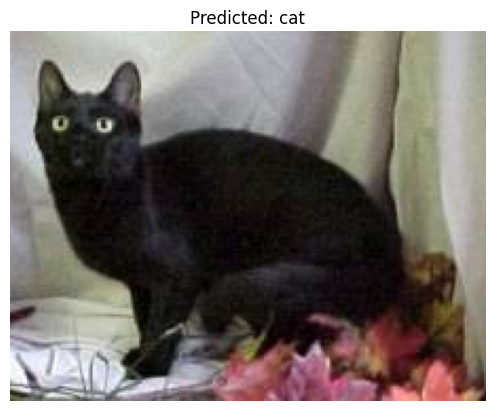

Test Image Path: C:\Users\j9902\Desktop\大三上\ML intro\ML-HW4\test\pic12.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


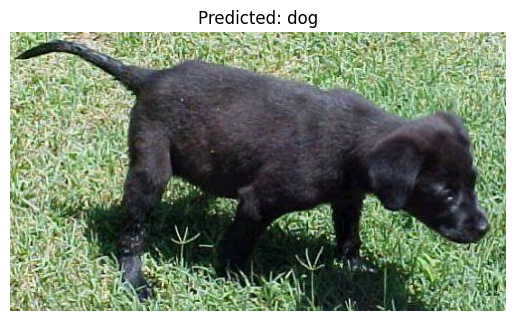

Test Image Path: C:\Users\j9902\Desktop\大三上\ML intro\ML-HW4\test\pic13.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


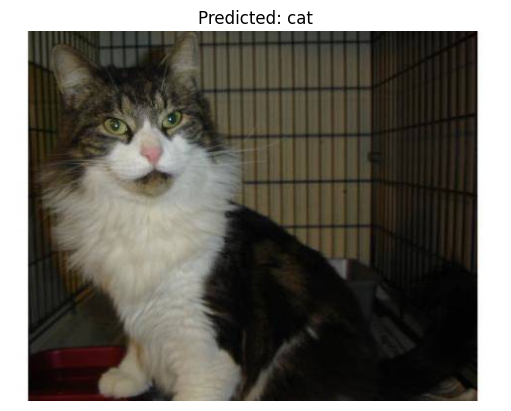

Test Image Path: C:\Users\j9902\Desktop\大三上\ML intro\ML-HW4\test\pic14.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


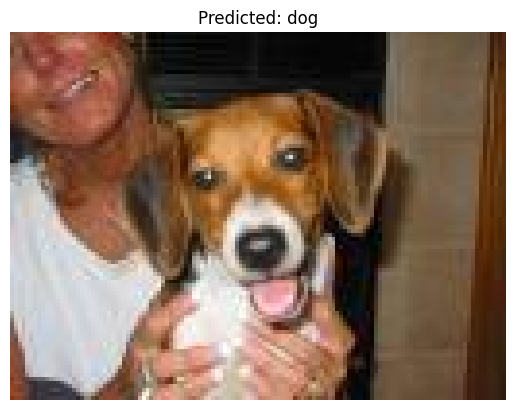

Test Image Path: C:\Users\j9902\Desktop\大三上\ML intro\ML-HW4\test\pic15.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


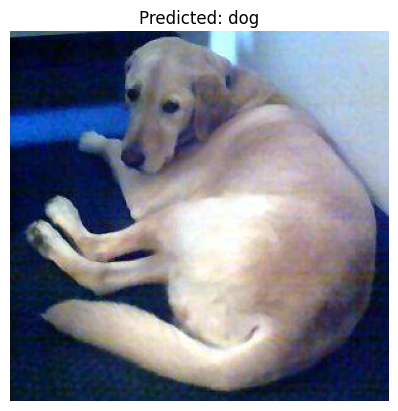

Test Image Path: C:\Users\j9902\Desktop\大三上\ML intro\ML-HW4\test\pic16.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


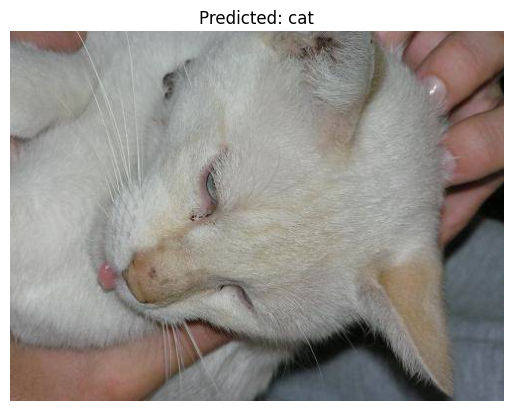

Test Image Path: C:\Users\j9902\Desktop\大三上\ML intro\ML-HW4\test\pic17.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


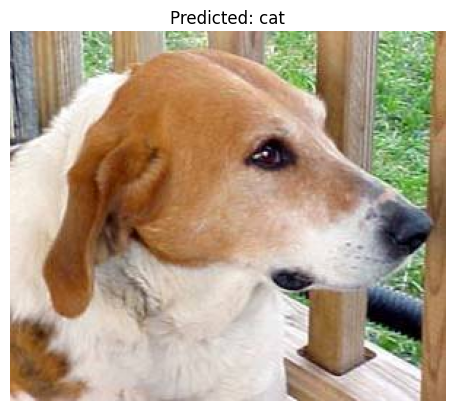

Test Image Path: C:\Users\j9902\Desktop\大三上\ML intro\ML-HW4\test\pic18.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


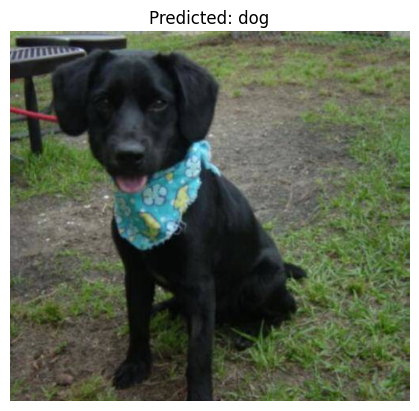

Test Image Path: C:\Users\j9902\Desktop\大三上\ML intro\ML-HW4\test\pic19.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


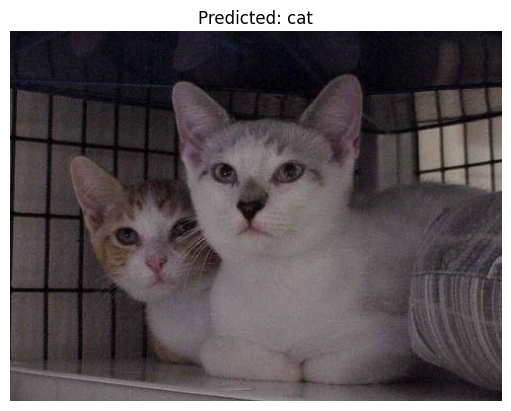

Test Image Path: C:\Users\j9902\Desktop\大三上\ML intro\ML-HW4\test\pic2.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


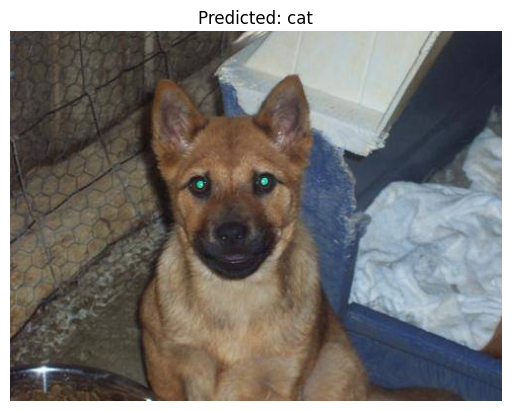

Test Image Path: C:\Users\j9902\Desktop\大三上\ML intro\ML-HW4\test\pic20.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


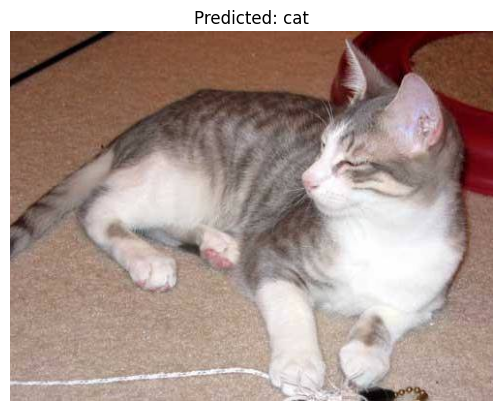

Test Image Path: C:\Users\j9902\Desktop\大三上\ML intro\ML-HW4\test\pic3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


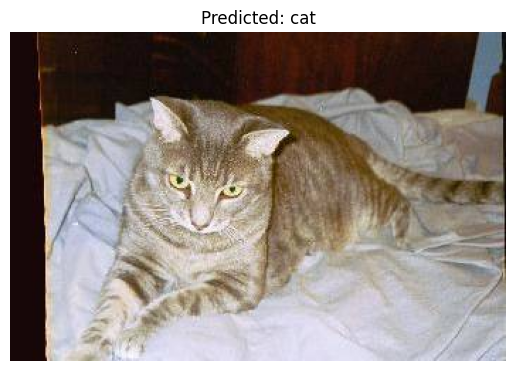

Test Image Path: C:\Users\j9902\Desktop\大三上\ML intro\ML-HW4\test\pic4.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


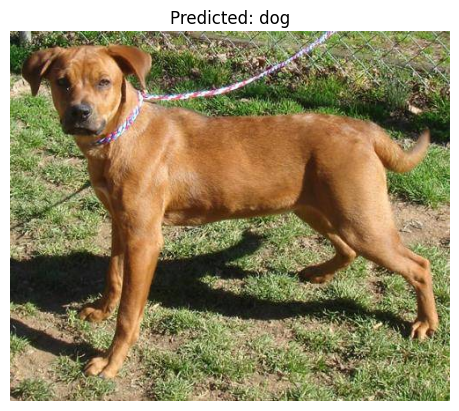

Test Image Path: C:\Users\j9902\Desktop\大三上\ML intro\ML-HW4\test\pic5.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


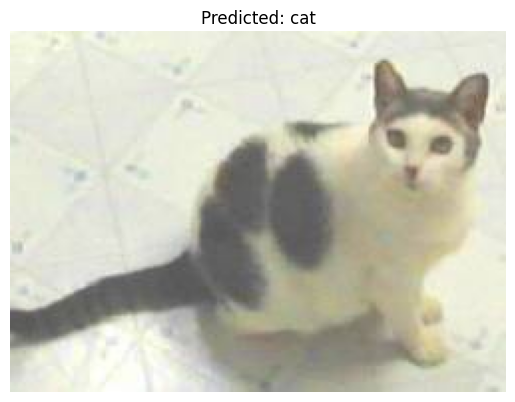

Test Image Path: C:\Users\j9902\Desktop\大三上\ML intro\ML-HW4\test\pic6.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


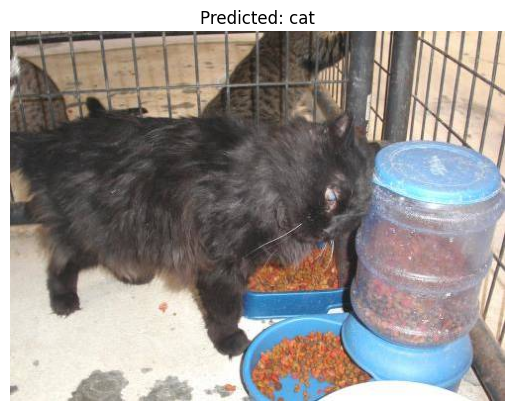

Test Image Path: C:\Users\j9902\Desktop\大三上\ML intro\ML-HW4\test\pic7.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


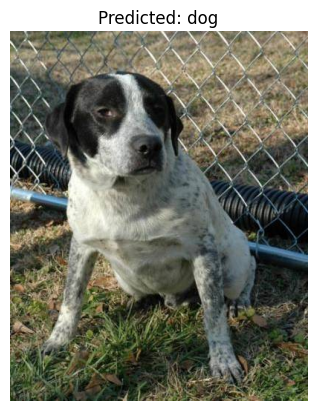

Test Image Path: C:\Users\j9902\Desktop\大三上\ML intro\ML-HW4\test\pic8.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


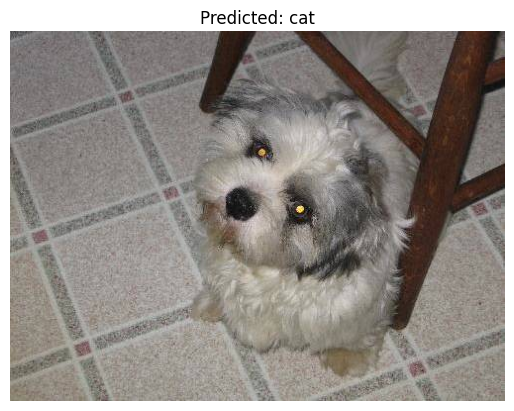

Test Image Path: C:\Users\j9902\Desktop\大三上\ML intro\ML-HW4\test\pic9.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


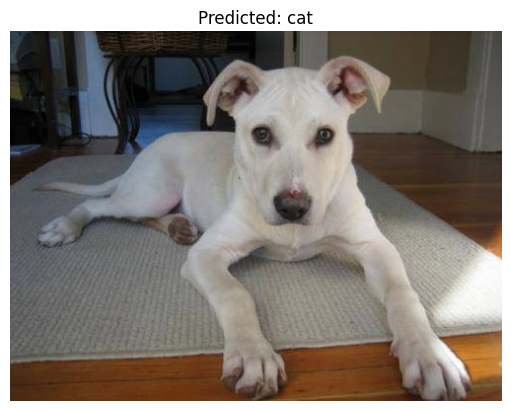

In [415]:
from collections import Counter
from scipy.spatial.distance import euclidean
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
import os

def get_embedding(image_path):
    #將圖片轉換為模型的embedding vector，使用就如同通過CNN 到flatten前面的layer，也就是萃取出特徵
    """Generate embedding vector for an image."""
    img = load_img(image_path, target_size=IMG_size)
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0) / 255.0  
    embedding = truncated_model.predict(img_array) # 使用擷取的CNN模型進行預測，生成embedding vector
    return embedding.flatten()

def calculate_similarity(embedding1, embedding2):
    #根據歐幾里得距離計算兩張圖片(embedding vector)之間的相似度。
    """Calculate similarity between two embedding vectors using Euclidean distance."""
    return euclidean(embedding1, embedding2)

def classify_image(test_image_path, dataset_embeddings, dataset_labels, top_k=5):
    #根據test裡面圖片與reference裡面圖片的embedding vector之間的歐幾里得距離距離進行分類
    #選擇最近的 k(=5) 張圖片，並根據大多數相似圖片的類別來確定預測結果。
    """Classify test image based on K nearest neighbors in embedding space."""
    test_embedding = get_embedding(test_image_path)
    similarities = [] ## 用來儲存每張參考圖片與測試圖片之間的相似度

    for embedding, label in zip(dataset_embeddings, dataset_labels):
        similarity = calculate_similarity(test_embedding, embedding)
        similarities.append((similarity, label))
    
     # 根據相似度排序，並選取最相似的 top_k 張圖片
    similarities.sort(key=lambda x: x[0]) ## 按照相似度（歐幾里得距離）排序
    top_labels = [label for _, label in similarities[:top_k]] ## 取出top_k圖片的標籤
    
    if not top_labels:
        return "No similar images found in the dataset."
    
    # 在top_k張圖片中找出出現次數最多的標籤，作為預測的標籤
    majority_label = Counter(top_labels).most_common(1)[0][0]
    return majority_label

def evaluate_knn_classifier(test_dir, dataset_embeddings, dataset_labels, top_k=5):
    """Evaluate KNN classifier on test images in the specified directory."""
    correct_predictions = 0
    test_images = os.listdir(test_dir)

    for test_image in test_images:
        test_image_path = os.path.join(test_dir, test_image)
        print(f"Test Image Path: {test_image_path}")  # Debugging line
       
        #  使用KNN進行分類
        predicted_class = classify_image(test_image_path, dataset_embeddings, dataset_labels, top_k)
        

         # 顯示圖片及預測結果
        img = load_img(test_image_path)
        plt.imshow(img)
        plt.title(f"Predicted: {predicted_class}")
        plt.axis('off')
        plt.show()

# Define the paths
test_dir = r'C:\Users\j9902\Desktop\大三上\ML intro\ML-HW4\test'
reference_dir = r'C:\Users\j9902\Desktop\大三上\ML intro\ML-HW4\reference'

# Load reference images and labels
reference_images = []
reference_labels = []

for category in ['cats', 'dogs']:
    category_dir = os.path.join(reference_dir, category)
    for img_name in os.listdir(category_dir):
        reference_images.append(os.path.join(category_dir, img_name))
        reference_labels.append(category[:-1])  # 'cats' -> 'cat', 'dogs' -> 'dog'

# Generate embeddings for reference images
dataset_embeddings = [get_embedding(img_path) for img_path in reference_images]
dataset_labels = reference_labels

# Evaluate the KNN classifier
evaluate_knn_classifier(test_dir, dataset_embeddings, dataset_labels, top_k=5)

## KNN結果分析


### 與HW1做比較

根據上面的結果，共有5張圖片預測錯誤。準確度75%

但是比起HW1單獨使用KNN，當時準確度大約只有50%，幾乎是亂猜的程度。

顯示在經過convolusion layer萃取特徵後，準確度確實有顯著提升

#### 與第一小題的完整CNN做比較：

第一小題預測準確度：0.85
第二小題預測準確度：0.75

顯示使用完整的CNN，能達到更好的效果

第一小題的完整CNN模型具備了所有卷積層和全連接層，這讓模型能夠更有效地捕捉圖片中的細節特徵，並在訓練過程中針對貓與狗圖片特徵進行優化。

但第二小題僅保留到Flatten層，來萃取特徵，沒有包含最終的分類層，因此無法像完整CNN那樣針對分類進行優化，而是使用KNN進行分類，所以接下來討論KNN。

KNN分類的限制： 僅靠KNN進行分類，KNN的效果主要取決於embedding vector的好壞和距離的計算。
儘管基於捲積層的embedding vector已經提取了部分圖片特徵，但這些特徵無法完全捕捉到所有重要的區別特徵，特別是當貓和狗之間的圖片特徵較為接近時，KNN的距離計算容易出現錯誤，導致分類準確度下降。

所以第二小題的缺少CNN最後幾層的高階特徵(想像成是有大局觀的學習，而非只是像捲基層那樣提取一些小特徵)學習。這樣的模型架構過於簡化，無法充分學習複雜的分類任務。

結論：全部使用neaural network的比knn表現更好。